In [ ]:
import pandas as pd
import seaborn as sns
import numpy as np
import random
import matplotlib.pyplot as plt
import plotly.express as px
import pysal
import libpysal
import scipy
import shapefile as shp
import geopandas as gpd
from statsmodels.sandbox.stats.multicomp import multipletests
from scipy.stats import pearsonr
from itertools import permutations
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules
from collections import defaultdict
from prefixspan import PrefixSpan
from gsppy.gsp import GSP
from episode_mining.minepi import MINEPI, MinEpiRules
from episode_mining.winepi import WINEPI, WinEpiRules
from sklearn.preprocessing import LabelEncoder
from pymining import itemmining, assocrules
from PAMI.recurringPattern.basic import RPGrowth as alg
from PAMI.extras.graph import plotLineGraphsFromDataFrame as pltGraph
from IPython.display import display
import json

import warnings
warnings.filterwarnings('ignore')

### Section 3 - Correlation Mining

In [2]:
nba = pd.read_csv("source/nba.csv")

In [3]:
nba.head()

,PLAYER,TEAM,AGE,GP,W,L,MIN,PTS,FGM,FGA,...,REB,AST,TOV,STL,BLK,PF,FP,DD2,TD3,X...
0,Aaron Gordon,ORL,23,78,40,38,33.8,16.0,6.0,13.4,...,7.4,3.7,2.1,0.7,0.7,2.2,32.6,19,0,1.4
1,Aaron Holiday,IND,22,50,31,19,12.9,5.9,2.1,5.2,...,1.3,1.7,0.8,0.4,0.3,1.4,11.3,0,0,2.0
2,Abdel Nader,OKC,25,61,38,23,11.4,4.0,1.5,3.5,...,1.9,0.3,0.4,0.3,0.2,1.1,7.9,0,0,-2.5
3,Al Horford,BOS,32,68,41,27,29.0,13.6,5.7,10.6,...,6.7,4.2,1.5,0.9,1.3,1.9,32.8,10,1,3.8
4,Al-Farouq Aminu,POR,28,81,52,29,28.3,9.4,3.2,7.3,...,7.5,1.3,0.9,0.8,0.4,1.8,23.2,12,0,4.7


<AxesSubplot:>

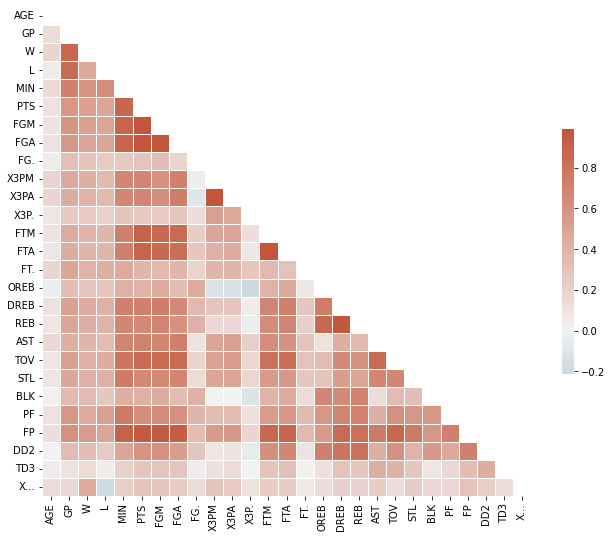

In [4]:
corr = nba.corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(230, 20, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, center=0, square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [5]:
nba_float = nba.drop(["PLAYER","TEAM"], axis=1)

p_values, p_values_col = [], []
for col in nba_float.columns:
    for col2 in nba_float.columns:
        p_values.append(pearsonr(nba_float[col], nba_float[col2])[1])
        p_values_col.append(col + " - " + col2)

p_values_corrected_bon = multipletests(p_values, method="bonferroni")[1]
p_values_corrected_holm = multipletests(p_values, method="holm")[1]

In [6]:
df_p = pd.DataFrame({"p_values": p_values, "pairs": p_values_col, "bonferroni": p_values_corrected_bon, "holm": p_values_corrected_holm})

In [7]:
df_p["bonferroni_sig"] = df_p["bonferroni"] >= 0.05
df_p["holm_sig"] = df_p["holm"] >= 0.05

In [8]:
df_p.head()

,p_values,pairs,bonferroni,holm,bonferroni_sig,holm_sig
0,0.000000,AGE - AGE,0.000000,0.000000,False,False
1,0.001490,AGE - GP,1.000000,0.163904,True,True
2,0.000019,AGE - W,0.013581,0.002720,False,False
3,0.307415,AGE - L,1.000000,1.000000,True,True
4,0.000439,AGE - MIN,0.320092,0.052690,True,True


- Explain how these techniques work and what the main differences are between Holm and Bonferonni. What other correction techniques
could have been used ?

Holm and Bonferroni correction techniques are used to control the type I error rate (false positive rate) in multiple comparisons.

Holm Correction: It is a stepwise correction method, where the p-values are ordered from smallest to largest and each p-value is divided by the number of comparisons remaining. The first comparison with a corrected p-value less than the significance level (α) is considered significant.

Bonferroni Correction: It is a simple correction method, where the significance level (α) is divided by the total number of comparisons being made. Each comparison is then considered significant if its p-value is less than the new significance level (α/m), where m is the number of comparisons.

The main difference between Holm and Bonferroni is the way they correct for multiple comparisons. Holm correction is more powerful and less conservative than Bonferroni correction, but it still controls the type I error rate.

Other correction techniques that could have been used include:

- Sidak Correction: adjusts the significance level (α) by taking into account the number of comparisons and desired level of overall confidence.
- False Discovery Rate (FDR) Correction: controls the expected proportion of false discoveries among all significant results.
- Benjamini-Hochberg Correction: a widely used FDR correction method, similar to Holm correction.

### Section 4 - Market Basket Analysis

In [11]:
df_retail = pd.read_csv("source/online_retail.csv")
df_tel = pd.read_csv("source/tel_samp_rec.csv")

In [10]:
tel_1_2 = df_tel[['disc1.rec.lev1', 'disc2.rec.lev1']]
tel_1_2 = tel_1_2.values.tolist()

In [11]:
tel_1_2.count(['III', 'V'])

37

In [12]:
tel_combo = df_tel[['disc1.rec.lev1', 'disc2.rec.lev1', 'disc3.rec.lev1']]
tel_combo = tel_combo.values.tolist()
for combo in tel_combo:
    pop_list = []
    for i in range(len(combo)):
        if str(combo[i]) == 'nan':
            pop_list.append(i)
    for k in reversed(pop_list):
        combo.pop(k)
tel_combo[:5]

[['X'], ['IV'], ['X'], ['V', 'V'], ['V', 'V']]

In [13]:
flattened = [i for t in tel_combo for i in t]
categories = list(set(flattened))
rules = list(permutations(categories, 2))

In [14]:
encoder = TransactionEncoder().fit(tel_combo)
onehot = encoder.transform(tel_combo)
onehot = pd.DataFrame(onehot, columns = encoder.columns_)

In [15]:
onehot

,I,I - Droit,II,III,IV,IX,V,VI,VII,VIII,X,XII,pharmacie
0,False,False,False,False,False,False,False,False,False,False,True,False,False
1,False,False,False,False,True,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,True,False,False
3,False,False,False,False,False,False,True,False,False,False,False,False,False
4,False,False,False,False,False,False,True,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
100041,False,False,False,False,False,False,False,False,False,True,False,False,False
100042,False,False,False,False,False,True,False,False,False,False,True,False,False
100043,False,False,False,False,False,False,False,False,False,False,True,False,True
100044,False,False,False,False,False,False,False,False,False,False,False,False,True


In [16]:
support = onehot.mean()
support

I            0.005717
I - Droit    0.012284
II           0.037063
III          0.026458
IV           0.087250
IX           0.272125
V            0.196250
VI           0.088189
VII          0.046808
VIII         0.086630
X            0.159727
XII          0.022400
pharmacie    0.005617
dtype: float64

In [17]:
print('Support for V and IX: ')
support_V_IX = np.logical_and(onehot['V'], onehot['IX']).mean()
support_V_IX

Support for V and IX: 


0.011104891749795094

In [18]:
print('Confidence for V and IX: ')
support_V = onehot['V'].mean()
support_IX = onehot['IX'].mean()
support_V / support_IX

Confidence for V and IX: 


0.7211753902662994

In [19]:
print('Lift for V and IX: ')
support_V_IX / ( support_V * support_IX )

Lift for V and IX: 


0.207939556510403

In [20]:
print('Conviction for V and IX: ')
( support_V * ( 1.0 - support_IX )) / ( support_V - support_V_IX )

Conviction for V and IX: 


0.7715327556784874

In [21]:
print("Zhang's metric for V and IX: ")
num = support_V_IX - ( support_V * support_IX )
denom = max((support_V_IX * ( 1.0 - support_V ) ), support_V * (support_IX - support_V_IX))
num / denom

Zhang's metric for V and IX: 


-0.8257580444973684

In [15]:
frequent_itemsets = apriori(onehot, min_support = 0.00005, max_len = 3, use_colnames = True)
frequent_itemsets.sort_values(by='support', ascending=False).head()

,support,itemsets
5,0.272125,(IX)
6,0.196250,(V)
10,0.159727,(X)
7,0.088189,(VI)
4,0.087250,(IV)


In [16]:
rules = association_rules(frequent_itemsets, metric = "support", min_threshold = 0.0005)
rules.sort_values(by='support', ascending=False).head()

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
27,(VI),(IX),0.088189,0.272125,0.013074,0.148249,0.544783,-0.010925,0.854563
26,(IX),(VI),0.272125,0.088189,0.013074,0.048044,0.544783,-0.010925,0.957829
25,(V),(IX),0.196250,0.272125,0.011105,0.056586,0.207940,-0.042300,0.771533
24,(IX),(V),0.272125,0.196250,0.011105,0.040808,0.207940,-0.042300,0.837945
31,(VIII),(IX),0.086630,0.272125,0.006567,0.075805,0.278566,-0.017007,0.787577


In [17]:
rules['antecedents'] = rules['antecedents'].apply(lambda x: ','.join(list(x)))
rules['consequents'] = rules['consequents'].apply(lambda x: ','.join(list(x)))

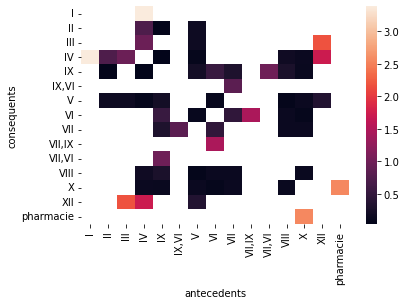

In [18]:
pivot = rules.pivot(index = 'consequents', columns = 'antecedents', values= 'lift')

sns.heatmap(pivot, annot = False, cbar = True)
plt.yticks(rotation=0)
plt.xticks(rotation=90)
plt.show()

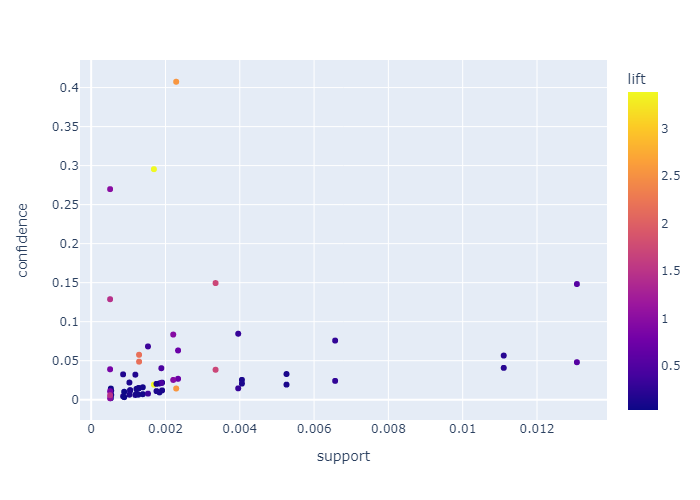

In [20]:
fig = px.scatter(rules, x="support", y="confidence", color="lift", hover_data=["antecedents", "consequents"])
fig.show(renderer = 'png')

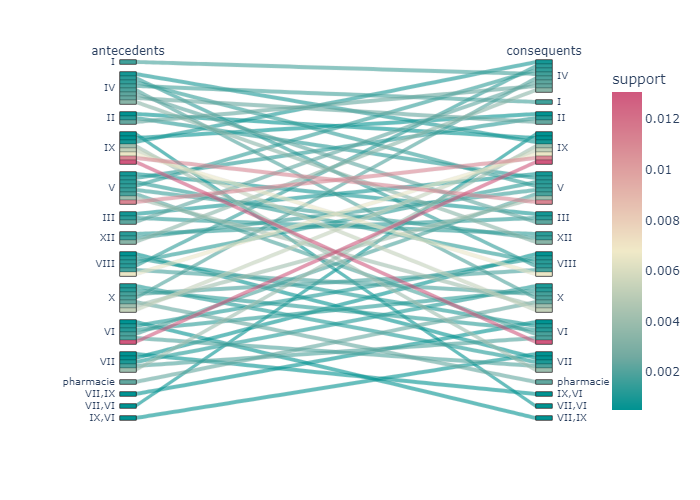

In [21]:
fig = px.parallel_categories(rules, color="support", color_continuous_scale=px.colors.diverging.Tealrose, dimensions=['antecedents', 'consequents'])
fig.show(renderer = 'png')

### Section 4 Appendix

Definition of relevant terms :

- Support is the fraction of transactions in the dataset that contain a particular itemset. In other words, it measures how frequently an itemset appears in the database. It is usually expressed as a percentage or a decimal value between 0 and 1. Higher support values indicate that an itemset is more frequent in the database.
- Lift is a measure of the increase in the ratio of the observed support of an itemset to the expected support if the items in the itemset were independent. It indicates the strength of the association between the items in the itemset. A lift value greater than 1 suggests a strong association between the items in the itemset, while a lift value less than 1 suggests a weak association.
- Confidence is a measure of the reliability of an association rule. It is defined as the proportion of transactions that contain the antecedent (left-hand side) of the rule in which the consequent (right-hand side) also appears. Confidence values range from 0 to 1, with higher values indicating a more reliable association rule.
- Leverage is a measure of the difference between the observed support of an itemset and the expected support if the items were independent. It indicates the deviation of the observed support from the expected support. A leverage value close to 0 indicates that the itemset is independent, while a high leverage value suggests a strong association between the items in the itemset.
- Conviction is a measure of the dependence of the consequent on the antecedent. It is defined as the ratio of the expected frequency of the consequent if the antecedent were false to the observed frequency of the antecedent. Higher conviction values indicate a strong dependence of the consequent on the antecedent.

- In the context of decision trees, pruning involves removing some of the branches of the tree that do not contribute much to the accuracy of the model. The idea is that these branches might lead to overfitting and can be safely removed without affecting the accuracy of the model. This can be achieved by setting a threshold on the information gain, or by using a cost-complexity measure to determine the trade-off between accuracy and complexity.

### Section 5 - Exploring Sequential Data

In [3]:
messages = pd.read_csv("source/messages.db.csv")

#### Section 5.2 - N-Gram

In [ ]:
# USELESS

convid = 1
conv = []
convos = []
for index, row in messages.iterrows():
    if convid == row['conversationid']:
        conv.append(row['message.type'])
    else:
        convid = row['conversationid']
        convos.append(conv)
        conv = []

In [9]:
convos = messages.groupby('conversationid')['message.type'].apply(list)

In [20]:
def generate_N_grams(text, ngram=3):
    words = [word for word in text.split(",")]
    temp = zip(*[words[i:] for i in range(0,ngram)])
    ans = [' '.join(ngram) for ngram in temp]
    return ans

In [22]:
values = defaultdict(int)

for convo in convos:
    for word in generate_N_grams(str(convo).replace("[", "").replace("]", "")):
        values[word] += 1

df_values = pd.DataFrame(sorted(values.items(), key=lambda x:x[1], reverse=True))
tri1 = df_values[0][:10]
tri2 = df_values[1][:10]

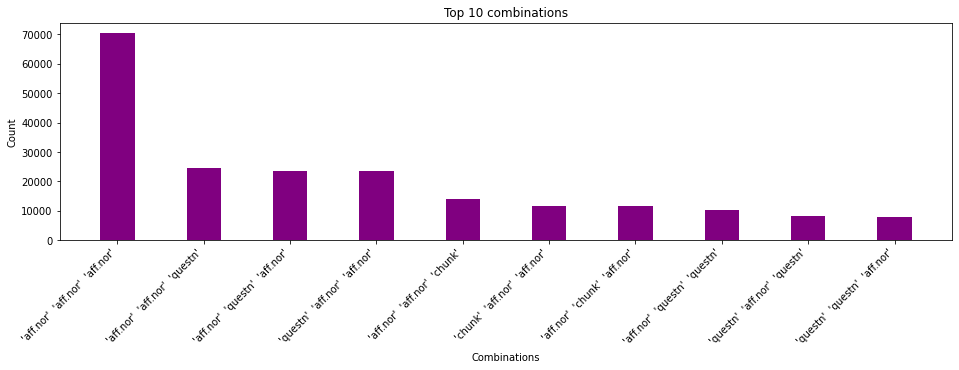

In [25]:
plt.figure(1, figsize=(16,4))
plt.bar(tri1, tri2, color ='purple', width = 0.4)
plt.xlabel("Combinations")
plt.ylabel("Count")
plt.title("Top 10 combinations")
plt.xticks(rotation=45, ha='right')
plt.show()

In [32]:
df_values[2] = df_values[1] / df_values[1].sum()
df_values[3] = round(df_values[2] * 100, 2)

df_values.head()

,0,1,2,3
0,'aff.nor' 'aff.nor' 'aff.nor',70528,0.208455,20.85
1,'aff.nor' 'aff.nor' 'questn',24573,0.072629,7.26
2,'aff.nor' 'questn' 'aff.nor',23375,0.069088,6.91
3,'questn' 'aff.nor' 'aff.nor',23337,0.068976,6.90
4,'aff.nor' 'aff.nor' 'chunk',14125,0.041748,4.17


In [10]:
convos.to_list()
convos = convos.apply(lambda x: x[-6:])

In [43]:
pd.DataFrame(convos.to_list()).to_csv("convos.csv", index=False)

#### Section 5.3 Appendix

Agglomerative Hierarchical Clustering is a type of hierarchical clustering algorithm that builds a tree-based representation of the data, known as a dendrogram. It starts by considering each data point as a separate cluster and then successively merges the closest pair of clusters until a single cluster or a predetermined number of clusters is obtained.

The algorithm works as follows:

- Initialize: Start by treating each data point as a separate cluster.
- Compute distance: Compute the distance between each pair of clusters. There are various ways to compute the distance between clusters, such as single-link, complete-link, average-link, or Ward's method.
- Merge clusters: Merge the two closest clusters into a single cluster.
- Repeat steps 2 and 3 until a single cluster or a predetermined number of clusters is obtained.
- Create dendrogram: Plot the dendrogram, which represents the hierarchy of the clusters.

Agglomerative Hierarchical Clustering is a bottom-up approach, as it starts with individual data points and builds the hierarchy of clusters incrementally. The algorithm is relatively simple, but the computational cost of computing the distance between all pairs of clusters grows quadratically with the number of data points. To address this issue, various strategies can be used, such as early stopping, representing clusters with centroids, or using approximation algorithms.

### Section 6 - Sequential Pattern Mining

In [4]:
transactions = pd.read_csv("source/messages.db.transaction.csv")

In [5]:
transactions = [list(item) for item in transactions.squeeze().to_list()]

In [6]:
ps = PrefixSpan(transactions)

In [10]:
ps.frequent(18000)

[(24573, ['A']),
 (23690, ['A', 'A']),
 (22475, ['A', 'A', 'A']),
 (20888, ['A', 'A', 'A', 'A']),
 (19021, ['A', 'A', 'A', 'A', 'A']),
 (18604, ['A', 'A', 'A', 'C']),
 (20267, ['A', 'A', 'C']),
 (18504, ['A', 'A', 'D']),
 (18294, ['A', 'B']),
 (21655, ['A', 'C']),
 (18841, ['A', 'C', 'A']),
 (19229, ['A', 'D']),
 (19555, ['B']),
 (22854, ['C']),
 (20477, ['C', 'A']),
 (18907, ['C', 'A', 'A']),
 (18910, ['C', 'C']),
 (18031, ['C', 'D']),
 (19629, ['D'])]

In [9]:
ps.topk(10)

[(24573, ['A']),
 (23690, ['A', 'A']),
 (22854, ['C']),
 (22475, ['A', 'A', 'A']),
 (21655, ['A', 'C']),
 (20888, ['A', 'A', 'A', 'A']),
 (20477, ['C', 'A']),
 (20267, ['A', 'A', 'C']),
 (19629, ['D']),
 (19555, ['B'])]

In [10]:
GSP(transactions).search(0.3)

[{('A',): 24573, ('B',): 19555, ('C',): 22854, ('D',): 19629, ('G',): 7541},
 {('A', 'A'): 22817,
  ('A', 'B'): 15793,
  ('B', 'A'): 13856,
  ('A', 'C'): 20045,
  ('B', 'B'): 8574,
  ('B', 'C'): 8620,
  ('C', 'A'): 19446,
  ('C', 'C'): 11252,
  ('C', 'D'): 7901},
 {('A', 'A', 'A'): 19111,
  ('A', 'A', 'B'): 11635,
  ('A', 'A', 'C'): 16446,
  ('A', 'B', 'A'): 9461,
  ('A', 'C', 'A'): 14707,
  ('B', 'A', 'A'): 9957,
  ('A', 'C', 'C'): 9012,
  ('C', 'A', 'A'): 15863},
 {('A', 'A', 'A', 'A'): 14214,
  ('A', 'A', 'A', 'B'): 7946,
  ('A', 'A', 'A', 'C'): 12137,
  ('A', 'A', 'C', 'A'): 10903,
  ('A', 'C', 'A', 'A'): 11031,
  ('C', 'A', 'A', 'A'): 11651},
 {('A', 'A', 'A', 'A', 'A'): 9658,
  ('A', 'A', 'A', 'A', 'C'): 8233,
  ('A', 'C', 'A', 'A', 'A'): 7563,
  ('C', 'A', 'A', 'A', 'A'): 7842}]

### Section 7 - Episode Mining

In [64]:
loan = pd.read_csv('source/Artificial - Loan Process.csv')
le = LabelEncoder()

In [65]:
loan = loan.drop('case', axis=1).set_index('completeTime').sort_index()
loan.reset_index(inplace=True)
loan.reset_index(inplace=True)
loan.rename(columns={'index': 'timestamp'}, inplace=True)
loan['label'] = le.fit_transform(loan['event'])
loan['label'] = loan['label'].astype(str)
loan.head()

,timestamp,completeTime,event,label
0,0,2013-04-16 10:08:02,register application,4
1,1,2013-04-16 10:10:02,register application,4
2,2,2013-04-16 10:15:42,register application,4
3,3,2013-04-16 10:16:03,check credit,2
4,4,2013-04-16 10:16:07,check credit,2


In [53]:
loan_list = list(zip(loan['timestamp'], loan['event']))
loan_list[:5]

[(0, 'register application'),
 (1, 'register application'),
 (2, 'register application'),
 (3, 'check credit'),
 (4, 'check credit')]

In [54]:
alg = WINEPI(loan_list, episode_type='parallel')
freqItems, suppData = alg.WinEpi(width=5, step=1, minFrequent=0.1)
winepiRules = WinEpiRules(freqItems, suppData, width=5, minConfidence=0.6)
ruleList = winepiRules.generateRules()
winepiRules.printRules(ruleList)

WINEPIRule: ['reject'] ==> ['check credit', 'reject'] [5] [0.3468013468013468, 0.6560509554140126]
WINEPIRule: ['reject'] ==> ['register application', 'reject'] [5] [0.3333333333333333, 0.6305732484076433]
WINEPIRule: ['send decision e-mail'] ==> ['register application', 'send decision e-mail'] [5] [0.39225589225589225, 0.6366120218579235]
WINEPIRule: ['send decision e-mail'] ==> ['check credit', 'send decision e-mail'] [5] [0.38552188552188554, 0.6256830601092896]
WINEPIRule: ['check system'] ==> ['check system', 'register application'] [5] [0.37037037037037035, 0.6395348837209301]
WINEPIRule: ['check system'] ==> ['check credit', 'check system'] [5] [0.3686868686868687, 0.6366279069767441]
WINEPIRule: ['calculate capacity'] ==> ['calculate capacity', 'register application'] [5] [0.3720538720538721, 0.603825136612022]
WINEPIRule: ['calculate capacity'] ==> ['calculate capacity', 'check credit'] [5] [0.37373737373737376, 0.6065573770491803]
WINEPIRule: ['check credit'] ==> ['check cred

In [66]:
loan_label = list(zip(loan['timestamp'], loan['label']))
loan_label[:5]

[(0, '4'), (1, '4'), (2, '4'), (3, '2'), (4, '2')]

In [91]:
alg = MINEPI(loan_label, episode_type='serial')
freqEpisodes = alg.MinEpi(max_width=6, step=2, minFrequent=0.2)
minepiRules = MinEpiRules(freqEpisodes, max_width=6, step=2, minConfidence=0.55)
ruleList = minepiRules.generateRules()
minepiRules.printRules(ruleList)

MINEPIRule: ['0'] [2] ==> ['0', '4'] [6] [10, 0.6]
MINEPIRule: ['0'] [4] ==> ['0', '4'] [6] [10, 0.6]
MINEPIRule: ['0'] [6] ==> ['0', '4'] [6] [10, 0.6]
MINEPIRule: ['5'] [2] ==> ['5', '6'] [6] [43, 0.6125]
MINEPIRule: ['5'] [4] ==> ['5', '6'] [6] [43, 0.6125]
MINEPIRule: ['5'] [6] ==> ['5', '6'] [6] [43, 0.6125]
MINEPIRule: ['0', '3'] [4] ==> ['0', '3', '4'] [6] [2, 0.6666666666666666]
MINEPIRule: ['0', '5'] [4] ==> ['0', '5', '3'] [6] [1, 1.0]
MINEPIRule: ['0', '5'] [6] ==> ['0', '5', '3'] [6] [1, 1.0]
MINEPIRule: ['2', '0'] [4] ==> ['2', '0', '1'] [6] [3, 0.6]
MINEPIRule: ['3', '0'] [4] ==> ['3', '0', '2'] [6] [2, 0.6666666666666666]
MINEPIRule: ['5', '1'] [4] ==> ['5', '1', '4'] [6] [5, 0.5555555555555556]


In [56]:
sequence = []
choices = ['left', 'right', 'center']
last_choices = [None, None]
for i in range(0, 100):
    if last_choices == ['left', 'left']:
        choice = 'right'
    elif last_choices == ['right', 'right']:
        choice = 'left'
    elif last_choices == ['center', 'center']:
        choice = random.choice(['left', 'right'])
    else:
        choice = random.choice(choices)
    last_choices.append(choice)
    last_choices.pop(0)
    sequence.append(choice)

In [57]:
sequence = pd.DataFrame(sequence, columns=['event'])
sequence['timestamp'] = sequence.index
sequence.head()

,event,timestamp
0,center,0
1,center,1
2,left,2
3,center,3
4,center,4


In [112]:
sequence_list = list(zip(sequence['timestamp'], sequence['event']))
sequence_list[:5]

[(0, 'right'), (1, 'left'), (2, 'center'), (3, 'left'), (4, 'right')]

In [114]:
alg = WINEPI(sequence_list, episode_type='parallel')
freqItems, suppData = alg.WinEpi(width=10, step=1, minFrequent=0.1)
winepiRules = WinEpiRules(freqItems, suppData, width=10, minConfidence=0.5)
ruleList = winepiRules.generateRules()
winepiRules.printRules(ruleList)

WINEPIRule: ['center'] ==> ['center', 'right'] [10] [0.908256880733945, 0.9705882352941176]
WINEPIRule: ['right'] ==> ['center', 'right'] [10] [0.908256880733945, 0.9519230769230769]
WINEPIRule: ['center'] ==> ['center', 'left'] [10] [0.9357798165137615, 1.0]
WINEPIRule: ['left'] ==> ['center', 'left'] [10] [0.9357798165137615, 0.9444444444444444]
WINEPIRule: ['left'] ==> ['left', 'right'] [10] [0.9541284403669725, 0.9629629629629629]
WINEPIRule: ['right'] ==> ['left', 'right'] [10] [0.9541284403669725, 1.0]
WINEPIRule: ['center'] ==> ['center', 'left', 'right'] [10] [0.908256880733945, 0.9705882352941176]
WINEPIRule: ['left'] ==> ['center', 'left', 'right'] [10] [0.908256880733945, 0.9166666666666666]
WINEPIRule: ['right'] ==> ['center', 'left', 'right'] [10] [0.908256880733945, 0.9519230769230769]
WINEPIRule: ['center', 'left'] ==> ['center', 'left', 'right'] [10] [0.908256880733945, 0.9705882352941176]
WINEPIRule: ['center', 'right'] ==> ['center', 'left', 'right'] [10] [0.908256880

### Section 7 Appendix

- A serial episode is a sequence of events that are connected to each other and follow a specific order or progression. Each event in the series builds on the previous one and contributes to the overall narrative or story. A serial episode is typically divided into parts, with each part representing a distinct step in the series of events.

- A parallel episode, on the other hand, involves two or more independent events happening at the same time, but with little or no connection to each other. These events may or may not impact each other, but they are not part of a larger narrative or story.

- A non-serial non-parallel episode is an episode that does not follow a specific sequence or progression, and does not involve two or more independent events happening at the same time. Instead, it is a standalone event that is not part of a larger series or narrative.

For example:

- A serial episode could be a mystery novel, where each chapter reveals a new clue and contributes to the overall story of solving the mystery.
- A parallel episode could be a movie that follows the lives of multiple characters, each with their own separate storyline, but with no connection to each other.
- A non-serial non-parallel episode could be a stand-alone short story, where a single event or series of events is portrayed, without any connection to a larger narrative.

MINEPI and WINEPI are two algorithms used in network intrusion detection systems (NIDS) to detect and prevent malicious activities on a network.

MINEPI (Minimum Entropy Pruning and Information Gain) is a feature selection algorithm that is used to reduce the number of features used in intrusion detection. It works by calculating the entropy of each feature and then selecting the features with the minimum entropy to use in the intrusion detection process. This approach helps reduce the number of false alarms generated by the NID system and improves its overall performance.

WINEPI (Weighted k-Nearest Neighbor based on Information Gain and Performance) is a k-nearest neighbor (k-NN) classification algorithm that is used in intrusion detection. It is a variation of the traditional k-NN algorithm that takes into account the information gain of each feature in the classification process. WINEPI assigns a weight to each feature based on its information gain, and then uses these weights in the classification process to determine if an incoming network traffic is normal or malicious. This approach helps improve the accuracy of the intrusion detection process by taking into account the importance of each feature.

In summary, MINEPI is a feature selection algorithm that reduces the number of features used in intrusion detection, while WINEPI is a classification algorithm that uses the information gain of each feature to improve the accuracy of the intrusion detection process.

### Section 8 - Periodic Pattern Mining

In [4]:
inputFile = 'source/recurrent pattern mining_data.csv'
seperator = ','
maximumPeriodCount = 5000
minimumSupportCountList = [100, 150, 200, 250, 300] 
minRec = 1.5

result = pd.DataFrame(columns=['algorithm', 'minSup','maxPer', 'patterns', 'runtime', 'memory'])

In [22]:
dictionary = json.load(open('source/encoded_events.json'))
inv_dict = {v: k for k, v in dictionary.items()}

In [33]:
algorithm = 'RPGrowth'
for minSupCount in minimumSupportCountList:
    obj = alg.RPGrowth(inputFile, minPS=minSupCount, maxPer=maximumPeriodCount, minRec=minRec, sep=seperator)
    obj.startMine()
    result.loc[result.shape[0]] = [algorithm, minSupCount,maximumPeriodCount, len(obj.getPatterns()), obj.getRuntime(), obj.getMemoryRSS()]
    df = obj.getPatternsAsDataFrame()
    df = df[df['Patterns'].str.contains('0')==False]
    df['Labels'] = df['Patterns'].apply(lambda x: [inv_dict[int(i)] for i in x.split(' ') if i != ''])
    with pd.option_context('display.max_colwidth', None):
        display(df)

Recurring patterns were generated successfully using RPGrowth algorithm 


,Patterns,Support,Recurrance,intervals,Labels
0,1 1 1,106,1,"{{[1113, 15888] : 105}}","[Business-Build-Packaging, Business-Build-Packaging, Business-Build-Packaging]"
1,7 3,110,1,"{{[7820, 21456] : 110}}","[Discretionary-Productive-Tracking, Business-Illustration-I1]"
2,4 9,127,1,"{{[96, 23290] : 127}}","[Discretionary-VideoGame-Hobbit, Discretionary-VideoGame-HarryPotter]"
3,1 1 2,133,1,"{{[3951, 22794] : 133}}","[Business-Build-Packaging, Business-Build-Packaging, Discretionary-VideoGame-LegendofHeroes]"
4,1 1 5,136,1,"{{[3343, 24572] : 136}}","[Business-Build-Packaging, Business-Build-Packaging, Discretionary-Other]"
5,6 8,141,1,"{{[3993, 26175] : 141}}","[Business-Work-Other, Discretionary-VideoGame-Nethack]"
6,4 3,171,1,"{{[4270, 17455] : 171}}","[Discretionary-VideoGame-Hobbit, Business-Illustration-I1]"
7,8 5,177,1,"{{[1262, 36021] : 177}}","[Discretionary-VideoGame-Nethack, Discretionary-Other]"
8,5 7,212,1,"{{[7593, 33942] : 212}}","[Discretionary-Other, Discretionary-Productive-Tracking]"
9,9 6,216,1,"{{[5108, 35004] : 216}}","[Discretionary-VideoGame-HarryPotter, Business-Work-Other]"


Recurring patterns were generated successfully using RPGrowth algorithm 


,Patterns,Support,Recurrance,intervals,Labels
0,4 3,171,1,"{{[4270, 17455] : 171}}","[Discretionary-VideoGame-Hobbit, Business-Illustration-I1]"
1,8 5,177,1,"{{[1262, 36021] : 177}}","[Discretionary-VideoGame-Nethack, Discretionary-Other]"
2,5 7,212,1,"{{[7593, 33942] : 212}}","[Discretionary-Other, Discretionary-Productive-Tracking]"
3,9 6,216,1,"{{[5108, 35004] : 216}}","[Discretionary-VideoGame-HarryPotter, Business-Work-Other]"
5,2 7,327,1,"{{[3, 23690] : 292}}","[Discretionary-VideoGame-LegendofHeroes, Discretionary-Productive-Tracking]"
7,7 9,378,1,"{{[20, 35939] : 378}}","[Discretionary-Productive-Tracking, Discretionary-VideoGame-HarryPotter]"
10,9 4,523,1,"{{[4994, 36239] : 523}}","[Discretionary-VideoGame-HarryPotter, Discretionary-VideoGame-Hobbit]"
11,3 3,577,1,"{{[1, 36163] : 577}}","[Business-Illustration-I1, Business-Illustration-I1]"
14,2,600,1,"{{[334, 36125] : 600}}",[Discretionary-VideoGame-LegendofHeroes]
15,5 4,601,1,"{{[1192, 31619] : 601}}","[Discretionary-Other, Discretionary-VideoGame-Hobbit]"


Recurring patterns were generated successfully using RPGrowth algorithm 


,Patterns,Support,Recurrance,intervals,Labels
0,5 7,212,1,"{{[7593, 33942] : 212}}","[Discretionary-Other, Discretionary-Productive-Tracking]"
1,9 6,216,1,"{{[5108, 35004] : 216}}","[Discretionary-VideoGame-HarryPotter, Business-Work-Other]"
2,2 7,327,1,"{{[3, 23690] : 292}}","[Discretionary-VideoGame-LegendofHeroes, Discretionary-Productive-Tracking]"
4,7 9,378,1,"{{[20, 35939] : 378}}","[Discretionary-Productive-Tracking, Discretionary-VideoGame-HarryPotter]"
7,9 4,523,1,"{{[4994, 36239] : 523}}","[Discretionary-VideoGame-HarryPotter, Discretionary-VideoGame-Hobbit]"
8,3 3,577,1,"{{[1, 36163] : 577}}","[Business-Illustration-I1, Business-Illustration-I1]"
11,2,600,1,"{{[334, 36125] : 600}}",[Discretionary-VideoGame-LegendofHeroes]
12,5 4,601,1,"{{[1192, 31619] : 601}}","[Discretionary-Other, Discretionary-VideoGame-Hobbit]"
13,5 2,650,1,"{{[1159, 18697] : 650}}","[Discretionary-Other, Discretionary-VideoGame-LegendofHeroes]"
14,8,715,1,"{{[473, 36198] : 715}}",[Discretionary-VideoGame-Nethack]


Recurring patterns were generated successfully using RPGrowth algorithm 


,Patterns,Support,Recurrance,intervals,Labels
0,2 7,327,1,"{{[3, 23690] : 292}}","[Discretionary-VideoGame-LegendofHeroes, Discretionary-Productive-Tracking]"
2,7 9,378,1,"{{[20, 35939] : 378}}","[Discretionary-Productive-Tracking, Discretionary-VideoGame-HarryPotter]"
5,9 4,523,1,"{{[4994, 36239] : 523}}","[Discretionary-VideoGame-HarryPotter, Discretionary-VideoGame-Hobbit]"
6,3 3,577,1,"{{[1, 36163] : 577}}","[Business-Illustration-I1, Business-Illustration-I1]"
9,2,600,1,"{{[334, 36125] : 600}}",[Discretionary-VideoGame-LegendofHeroes]
10,5 4,601,1,"{{[1192, 31619] : 601}}","[Discretionary-Other, Discretionary-VideoGame-Hobbit]"
11,5 2,650,1,"{{[1159, 18697] : 650}}","[Discretionary-Other, Discretionary-VideoGame-LegendofHeroes]"
12,8,715,1,"{{[473, 36198] : 715}}",[Discretionary-VideoGame-Nethack]
13,2 6,828,1,"{{[8, 36205] : 828}}","[Discretionary-VideoGame-LegendofHeroes, Business-Work-Other]"
14,8 7,902,1,"{{[3081, 36160] : 902}}","[Discretionary-VideoGame-Nethack, Discretionary-Productive-Tracking]"


Recurring patterns were generated successfully using RPGrowth algorithm 


,Patterns,Support,Recurrance,intervals,Labels
1,7 9,378,1,"{{[20, 35939] : 378}}","[Discretionary-Productive-Tracking, Discretionary-VideoGame-HarryPotter]"
4,9 4,523,1,"{{[4994, 36239] : 523}}","[Discretionary-VideoGame-HarryPotter, Discretionary-VideoGame-Hobbit]"
5,3 3,577,1,"{{[1, 36163] : 577}}","[Business-Illustration-I1, Business-Illustration-I1]"
8,2,600,1,"{{[334, 36125] : 600}}",[Discretionary-VideoGame-LegendofHeroes]
9,5 4,601,1,"{{[1192, 31619] : 601}}","[Discretionary-Other, Discretionary-VideoGame-Hobbit]"
10,5 2,650,1,"{{[1159, 18697] : 650}}","[Discretionary-Other, Discretionary-VideoGame-LegendofHeroes]"
11,8,715,1,"{{[473, 36198] : 715}}",[Discretionary-VideoGame-Nethack]
12,2 6,828,1,"{{[8, 36205] : 828}}","[Discretionary-VideoGame-LegendofHeroes, Business-Work-Other]"
13,8 7,902,1,"{{[3081, 36160] : 902}}","[Discretionary-VideoGame-Nethack, Discretionary-Productive-Tracking]"
14,2 1,965,1,"{{[4, 36256] : 965}}","[Discretionary-VideoGame-LegendofHeroes, Business-Build-Packaging]"


In [6]:
result

,algorithm,minSup,maxPer,patterns,runtime,memory
0,RPGrowth,100,5000,38,0.267395,265875456
1,RPGrowth,150,5000,32,0.275880,266235904
2,RPGrowth,200,5000,29,0.268848,266354688
3,RPGrowth,250,5000,27,0.164717,266330112
4,RPGrowth,300,5000,26,0.260561,266629120


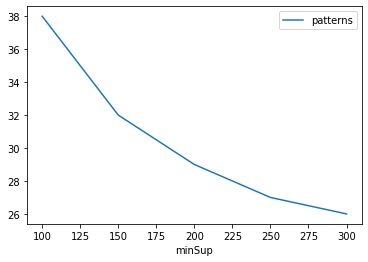

Graph for No Of Patterns is successfully generated!


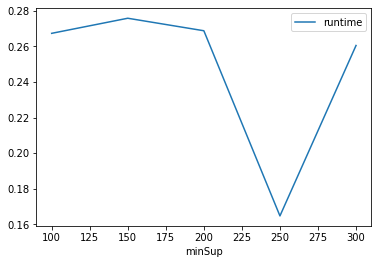

Graph for Runtime taken is successfully generated!


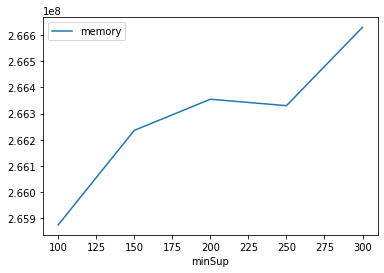

Graph for memory consumption is successfully generated!


In [8]:
ab = pltGraph.plotGraphsFromDataFrame(result)
ab.plotGraphsFromDataFrame()

### Section 9 - Spatial Associations

- Part I - Data Understanding

In [2]:
# define a function that takes a shapefile as argument, and plots all shapes within on the current figure
# style can be defined or by default green with continuous line

def shape_layer(shapefile, style="g-"):
    sf = shp.Reader(shapefile)
    coords = []
    for shape in sf.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]
        y = [i[1] for i in shape.shape.points[:]]
        plt.plot(x, y, style, zorder=10)

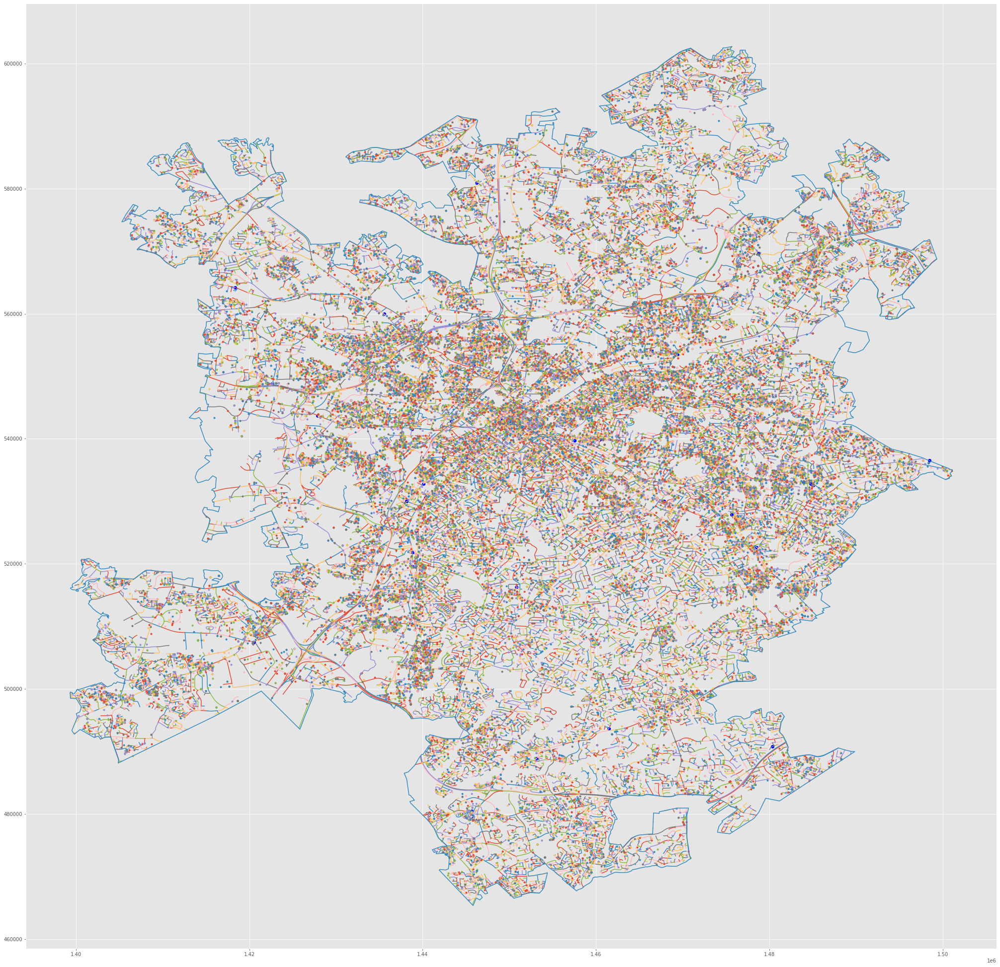

In [3]:
# define figure size and plot style for all subsequent graphs

fig_size = [35, 35]
plt.rcParams["figure.figsize"] = fig_size
plt.style.use('ggplot')

# create a figure and plot the following shapes
# Bars as big blue dots, Streets as colored lines, Crimes as colored dots, Border as a continous line

plt.figure()
shape_layer("./source/Data/POI_AlcoholicDrinkingPlaces_CLIP.shp", style="bo")
shape_layer("./source/Data/CLT_Streets.shp", style="-")
shape_layer("./source/Data/CrimeIncident_CMPD_2010.shp", style=".")
shape_layer("./source/Data/CLT_Boundary.shp", style="-")
plt.show()

In [7]:
# import Block Groups Attributes database, convert as dataframe, print its shape and first 5 rows

db_bgroups = libpysal.io.open('./source/Data/CLT_BlockGroups_Attr.dbf')
df_bgroups = pd.DataFrame(db_bgroups[:], columns=db_bgroups.header)
print(df_bgroups.shape)
df_bgroups[:5]

(485, 18)


,STATEFP10,COUNTYFP10,TRACTCE10,BLKGRPCE10,GEOID10,NAMELSAD10,MTFCC10,FUNCSTAT10,ALAND10,AWATER10,INTPTLAT10,INTPTLON10,ARPCIncome,ARPerHEdu,ARPerWork,ARPerMI5L,ARPerRMI5L,ARPer3MU
0,37,119,005301,1,371190053011,Block Group 1,G5030,S,3692032,0,+35.2582845,-080.8060757,12375.0,7.486865,69.674647,73.998045,68.132942,82.098765
1,37,119,001400,2,371190014002,Block Group 2,G5030,S,1051009,0,+35.2437169,-080.8024062,39139.0,13.474495,83.140878,55.172414,25.689655,27.016645
2,37,119,001200,3,371190012003,Block Group 3,G5030,S,2111630,6882,+35.2274080,-080.7930404,60271.0,9.193122,89.514066,23.713927,12.421581,3.436019
3,37,119,005847,1,371190058471,Block Group 1,G5030,S,2937830,19993,+35.0855266,-080.7642117,70142.0,13.423352,84.393758,20.808081,0.000000,0.000000
4,37,119,000700,1,371190007001,Block Group 1,G5030,S,1271722,0,+35.2385940,-080.8190269,28051.0,4.301075,72.321429,51.704545,29.829545,66.190476


In [9]:
# import Block Attributes database, convert as dataframe, print its shape and first 5 rows

db_blocks = libpysal.io.open('./source/Data/CLT_Blocks_Attr.dbf','r')
df_blocks = pd.DataFrame(db_blocks[:], columns=db_blocks.header)
print(df_blocks.shape)
df_blocks[:5]

(8354, 12)


,STATEFP10,COUNTYFP10,TRACTCE10,BLOCKCE,BLOCKID10,PARTFLG,ARPopDen,ARPerAA,ARHeteInx,ARPerM1724,ARPerHOwn,ARPerSF
0,37,119,005401,2028,371190054012028,N,0.000116,97.590361,0.047322,3.614458,84.615385,33.333333
1,37,119,004600,2025,371190046002025,N,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2,37,119,004100,2005,371190041002005,N,0.000276,21.428571,0.482143,7.142857,61.290323,3.225806
3,37,119,005521,3047,371190055213047,N,0.000216,85.106383,0.266184,4.255319,100.000000,14.285714
4,37,119,005200,3043,371190052003043,N,0.000085,50.000000,0.500000,0.000000,0.000000,0.000000


In [11]:
# import the Streets Crime and Businesses database, convert into dataframe, sort by CrimeCount and show first 3 rows

db_crime_per_street = libpysal.io.open('./source/Data/CLT_Streets_crmCntAUNCC_Business.dbf','r')
df_crime_per_street = pd.DataFrame(db_crime_per_street[:], columns=db_crime_per_street.header)
df_crime_per_street.sort_values(by="crmCntAUNC", ascending=False)[:3]

,WHOLESTNAM,crmCntAUNC,BusinCnt
31873,N Tryon St,428,2
14911,E Trade St,392,19
904,Wilkinson Bv,376,26


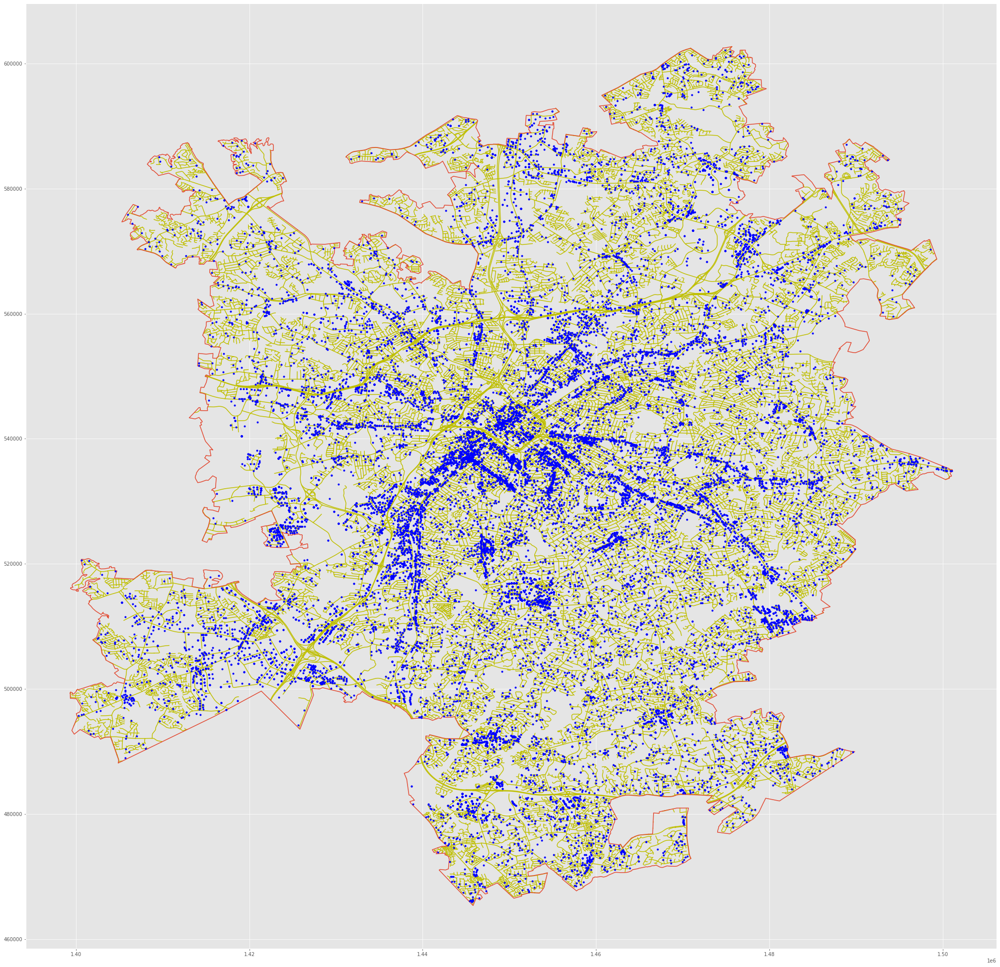

In [12]:
# create a new figure and plot the following shapes
# Streets as yellow lines, Border as a continuous line, Business Places as blue dots

fig_size = [35, 35]
plt.rcParams["figure.figsize"] = fig_size
shape_layer("./source/Data/CLT_Streets.shp", style="y-")
shape_layer("./source/Data/CLT_Boundary.shp", style="-")
shape_layer("./source/Data/CLT_Business_Attri.shp", style="b.")

In [13]:
# import Business Attributes database, convert as dataframe, print its shape and first 4 rows

db_business = libpysal.io.open('./source/Data/CLT_Business_Attri.dbf','r')
df_business = pd.DataFrame(db_business[:], columns=db_business.header)
print(df_business.shape)
df_business[:4]

(24375, 80)


,OBJECTID,Join_Count,ID,NUM_ADDR,NUMADD_M,Match_,year_,Quarter,NAICS,CntCode,...,extra_Info,NewAdd11,emp_old,tempadd,StrMapped,WHOLESTNAM,WHOLESTN_F,ST_NAME,ST_NAME_LA,StrMapID
0,18421,1,48567.0,339743,339743,g,2008.0,1.0,531210.0,119,...,0,0,4,0,0,LANCASTER HWY,LANCASTER HY,LANCASTER,HY,28294
1,29072,0,20100386.0,,,,2008.0,1.0,518210.0,119,...,1,0,10,-2,0,LANCASTER HWY,LANCASTER HY,LANCASTER,HY,28294
2,7961,1,288651.0,464886,0,g,2008.0,1.0,541410.0,119,...,0,0,2,0,0,LANCASTER HWY,LANCASTER HY,LANCASTER,HY,28294
3,12303,1,358823.0,464886,0,g,2008.0,1.0,541310.0,119,...,0,0,4,0,0,LANCASTER HWY,LANCASTER HY,LANCASTER,HY,28294


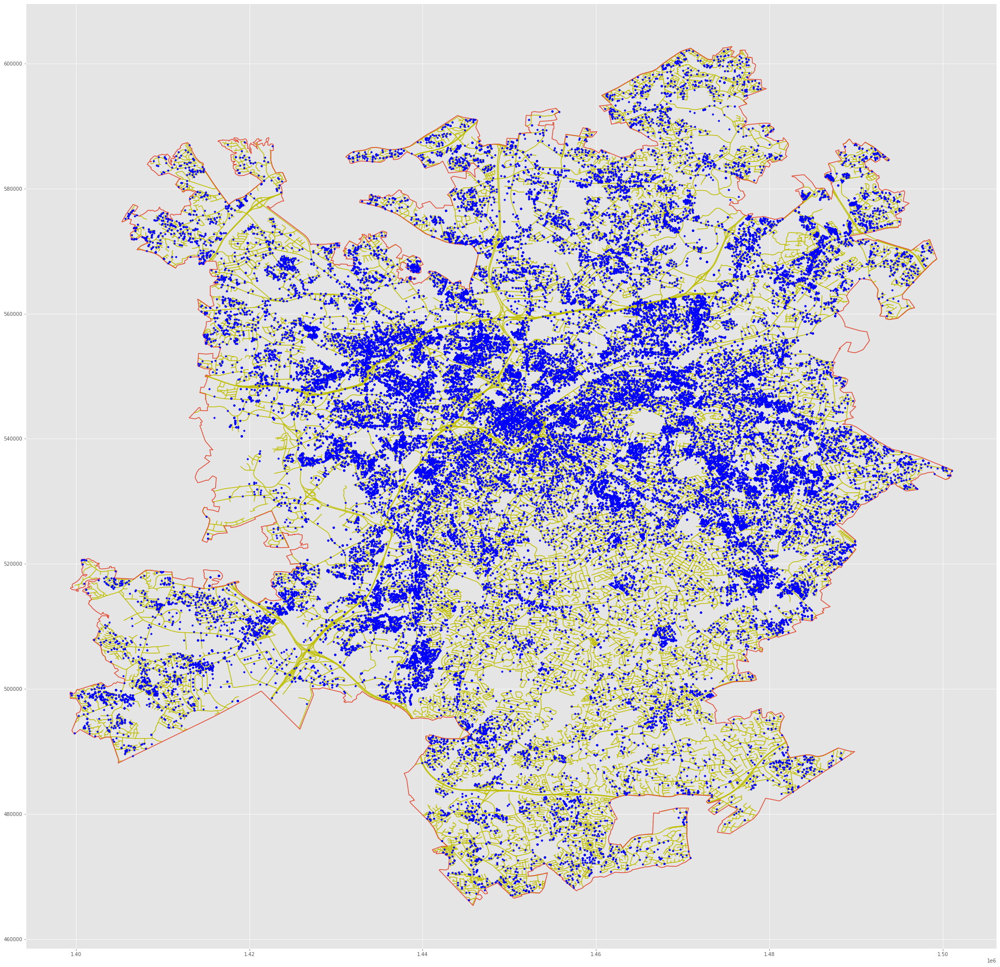

In [15]:
# create a new figure and plot the following shapes
# Streets as yellow lines, Border as a continuous line, Crime Locations as blue dots

fig_size = [35, 35]
plt.rcParams["figure.figsize"] = fig_size
shape_layer("./source/Data/CLT_Streets.shp", style="y-")
shape_layer("./source/Data/CLT_Boundary.shp", style="-")
shape_layer("./source/Data/CrimeIncident_CMPD_2010.shp", style="b.")

In [17]:
# import Crime Incidents database, convert as dataframe, limit Pandas' display of columns, print its shape and first 2 rows

db_crimes = libpysal.io.open('./source/Data/CrimeIncident_CMPD_2010.dbf','r')
df_crimes = pd.DataFrame(db_crimes[0:-1], columns=db_crimes.header)
pd.set_option('display.max_columns',  100)
print(df_crimes.shape)
df_crimes[:2]

(67594, 53)


,OBJECTID_1,OBJECTID,Complaint_,ComplainNo,Block_No,Direction,Street_Nam,Street_Typ,Suffix,Apt_No,City,State,ZipCode,X,Y,Division,Report_Dat,Location_D,Location_T,Incident_F,Incident_T,Place1,Place2,CSS_Called,Clearance_,Clearance1,Case_Statu,Reporting_,Follow_Up_,NIBRS_Hi_C,rp_last_na,rp_first_n,rp_middle_,rp_Block_N,rp_Directi,rp_Street_,rp_Street1,re_Suffix,rp_Apt_No,rp_City,rp_State,rp_ZipCode,F41,F42,OID_,Complaint1,Complain_1,Attempt,NIBRScateg,NIBRSclass,NOCcode,strMapped,WHOLESTNAM
0,1,1,2.010010e+13,20100101000504,1120.0,,SCALEYBARK,RD,,,CHARLOTTE,NC,,1444054.0,523228.0,26.0,01/01/2010 0005,Location of occurrence,Indoors,01/01/2010 0005,,Residential,Apartment/Duplex Private Res,N,Normal Clearance - Cleared by Arrest,1/1/2010,Close/Cleared,Charlotte-Mecklenburg Police Department,26-WESTOVER DIVISION,Simple Assault,ISENHOUR,#3907,,,,,,,,,,,,,0,2.010010e+13,20100101000504,Completed,Assault / Assault: on Government Officer or Em...,Simple Assault,13B,1,SCALEYBARK RD
1,2,2,2.010010e+13,20100101000506,8305.0,,SHINKANSEN,DR,,,CHARLOTTE,NC,28213,1481937.0,562104.0,14.0,01/01/2010 0005,Location of occurrence,Outdoors,01/01/2010 0005,,Residential,Private Residence,N,Normal Clearance - Cleared by Arrest,1/1/2010,Close/Cleared,Charlotte-Mecklenburg Police Department,14-UNIVERSITY CITY DIVISION,Drug/Narcotic Violations,ROCEDAR,ALFORD,,8309,,SHINKANSEN,DR,,,CHARLOTTE,NC,28213,,,1,2.010010e+13,20100101000506,Completed,Miscellaneous criminal / Other Unlisted Crimin...,Drug/Narcotic Violations,90Z,1,SHINKANSEN DR


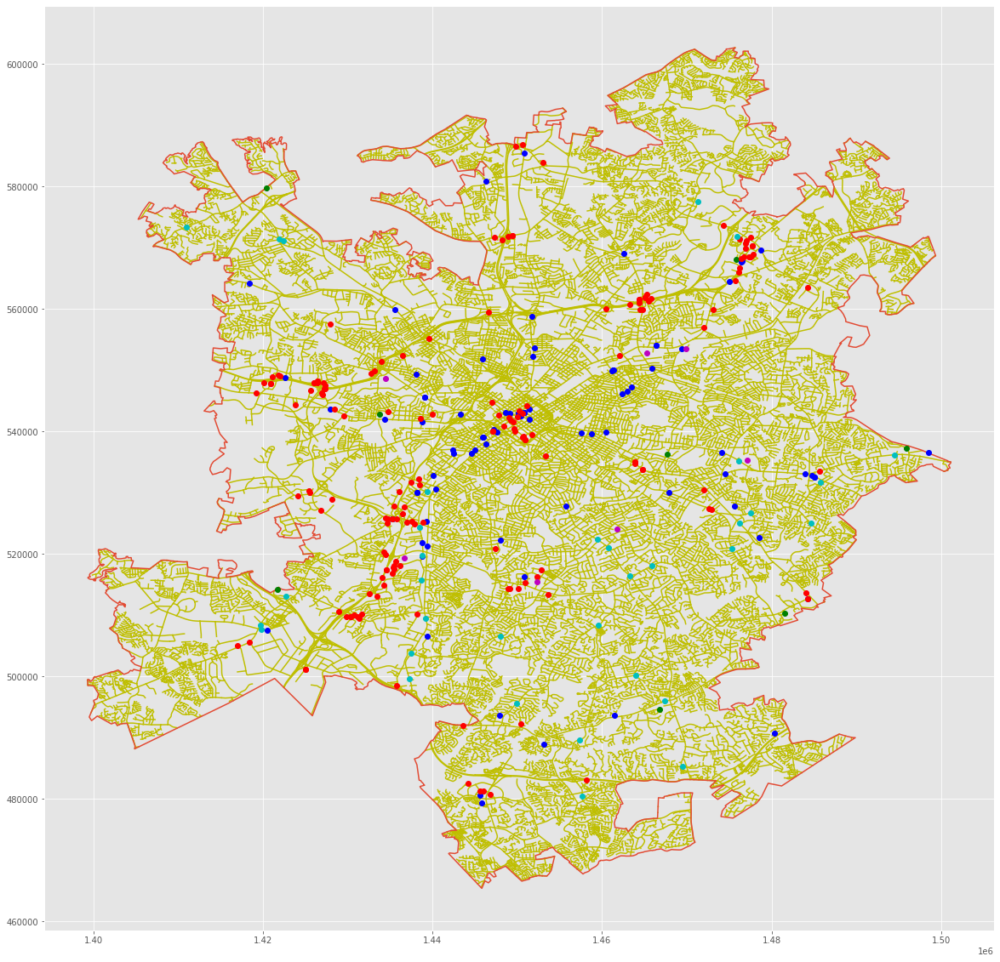

In [18]:
# create a new figure and plot the following shapes
# Streets as yellow lines, Border as a continous line
# Walmarts as green circles, Bars as blue circles, Hotels as red circles, Malls as purple circles, Parking lots as cyan circles

fig_size = [20, 20]
plt.rcParams["figure.figsize"] = fig_size
shape_layer("./source/Data/CLT_Streets.shp", style="y-")
shape_layer("./source/Data/CLT_Boundary.shp", style="-")

shape_layer("./source/Data/POI_WALMART.shp", style="go")
shape_layer("./source/Data/POI_AlcoholicDrinkingPlaces_CLIP.shp", style="bo")
shape_layer("./source/Data/POI_HotelsMotels.shp", style="ro")
shape_layer("./source/Data/POI_Malls.shp", style="mo")
shape_layer("./source/Data/POI_ParknRideFacilities.shp", style="co")

In [20]:
# import Malls database, convert as dataframe, limit Pandas' display of rows, print its size and itself

db_mall = libpysal.io.open('./source/Data/POI_Malls.dbf','r')
df_mall = pd.DataFrame(db_mall[0:-1], columns=db_mall.header)
pd.set_option('display.max_rows', 100)
print(len(df_mall))
df_mall

6


,OBJECTID,ADDRESS,BLDG_SF,FIRM_NAME,NAME
0,8,4400 FAIRVIEW ROAD,1161538,TRAMMELL CROW COMPANY,SOUTHPARK MALL
1,3,500 TYVOLA ROAD,298748,N/A,TYVOLA PLACE
2,2,160 S SHARON AMITY ROAD,273150,HILL PARTNERS,COTSWOLD MALL
3,7,5651 CENTRAL AVENUE,1220356,GLIMCHER PROPERTIES,EASTLAND MALL
4,5,3205 FREEDOM DRIVE,374988,FREEDOM MALL PARTNERS,FREEDOM MALL
5,4,4500 N TRYON STREET,310000,WALKER REAL ESTATE GROUP,TRYON PLACE


- Part III - Modeling

In [3]:
# create an apply function to transform a transactions list into a tuple

to_tuple = lambda trans_list: tuple([tuple(trans) for trans in trans_list])

# create a function that filters through a set of given rules in a given dataframe
# only keeps rules that contain the given columns by checking each one
# can specify to keep only rules in consequent with a boolean

def only_rules_with(columns, dataframe, rules, only_cons=False):
    list_of_sets = [set(dataframe[column].values) for column in columns]
    result = []
    for rule in rules:
        current_itemset = rule[1] if only_cons else rule[0] | rule[1]
        cond = True
        for column_set in list_of_sets:
            if (current_itemset & column_set) == set():
                cond = False
        if cond:
            result.append(rule)
    return result

# create a function to write given rules into a new file created with the given path

def print_that(filepath, rules):
    with open(filepath, 'w+') as result_file:
        for rule in rules:
            result_file.write(rule_to_string(rule))

# create a function to convert rules type into a readable string

def rule_to_string(rule):
    return str([j for j in rule[0]]) + "  ->  " + str([z for z in rule[1]]) + \
    ", supp: " + str(rule[2]) + \
    ", conf: " + str(rule[3]) + \
    "\n"

In [ ]:
# import Crimes Census Sampled database and print its shape

df = pd.read_csv("./source/crimes_census_5poi_sampled100.csv", index_col=0, sep="\t")
df.shape

In [38]:
# remove the columns we aren't interested in
# transform rows into a transactions list
# print the dataframe's shape and each feature's statistical properties

df = df.drop(["BLOCKID10", "Street_Nam", "ARPerRMI5L", "ARPer3MU", "ARHeteInx", "ARPerHOwn"], axis=1)
df = df.drop(["First_POI", "Second_POI", "Third_POI", "Fourth_POI", "Fifth_POI"], axis=1)
transactions = [row.tolist() for i, row in df.iterrows()]

print(df.shape)
df.describe()

(2954, 10)


,ARPCIncome,ARPerHEdu,ARPerWork,ARPopDen,ARPerAA,ARPerM1724,ARPerSF,NIBRSclass,Place2,Report_Dat
count,2954,2954,2954,2954,2954,2954,2954,2954,2954,2954
unique,7,7,7,7,7,7,7,52,60,36
top,inc-1/7,edu-4/7,empl-1/7,popden-5/7,afro-1/7,youngm-4/7,sinpar-6/7,Credit Card/Teller Fraud,Private Residence,07-2x
freq,528,482,590,535,596,678,585,100,511,109


In [39]:
# choose the minimum support for the rules

min_supp = 10

In [40]:
%%time

# get computing time
# format the transactions list and feed it to the relim algorithm
# print the number of obtained frequent itemsets

relim_input = itemmining.get_relim_input(to_tuple(transactions))
relim_itemsets = itemmining.relim(relim_input, min_support=min_supp)
print("number of frequent itemsets", len(relim_itemsets), "\n")

number of frequent itemsets 21140 

CPU times: total: 312 ms
Wall time: 655 ms


In [41]:
# choose the minimum confidence for the rules

min_conf = 0.60

In [42]:
%%time

# get computing time
# use frequent itemsets to obtain the association rules and print their number

rules = assocrules.mine_assoc_rules(relim_itemsets, min_support=min_supp, min_confidence=min_conf)
print(len(rules))

175934
CPU times: total: 2.38 s
Wall time: 2.7 s


In [ ]:
# filter to keep only rules containing crimes and print their number
# filter to keep only rules in consequent containing crimes and print their number

rules_with_crimes = only_rules_with(["NIBRSclass"], df, rules)
print("# of rules with crimes:", len(rules_with_crimes))
rules_with_crimes_in_cons = only_rules_with(["NIBRSclass"], df, rules, only_cons=True)
print("# of rules with crimes in consequent:", len(rules_with_crimes_in_cons))

In [55]:
# print the first 10 rules in a readable form

for rule in rules_with_crimes_in_cons[:10]:
    print(rule_to_string(rule))

['popden-2/7', 'edu-7/7', 'afro-6/7', 'ATM', 'sinpar-5/7', 'inc-1/7', 'youngm-7/7']  ->  ['empl-1/7', 'Credit Card/Teller Fraud'], supp: 10, conf: 1.0

['ATM', 'youngm-7/7', 'edu-7/7', 'sinpar-5/7', 'afro-6/7', 'inc-1/7']  ->  ['empl-1/7', 'Credit Card/Teller Fraud', 'popden-2/7'], supp: 10, conf: 1.0

['ATM', 'edu-7/7', 'sinpar-5/7', 'afro-6/7', 'inc-1/7']  ->  ['youngm-7/7', 'empl-1/7', 'Credit Card/Teller Fraud', 'popden-2/7'], supp: 10, conf: 1.0

['ATM', 'sinpar-5/7', 'afro-6/7', 'inc-1/7']  ->  ['empl-1/7', 'Credit Card/Teller Fraud', 'popden-2/7', 'edu-7/7', 'youngm-7/7'], supp: 10, conf: 1.0

['ATM', 'afro-6/7', 'inc-1/7']  ->  ['empl-1/7', 'Credit Card/Teller Fraud', 'popden-2/7', 'edu-7/7', 'sinpar-5/7', 'youngm-7/7'], supp: 10, conf: 1.0

['ATM', 'inc-1/7']  ->  ['empl-1/7', 'Credit Card/Teller Fraud', 'popden-2/7', 'edu-7/7', 'sinpar-5/7', 'afro-6/7', 'youngm-7/7'], supp: 10, conf: 1.0

['ATM', 'afro-6/7']  ->  ['empl-1/7', 'Credit Card/Teller Fraud', 'popden-2/7', 'edu-7/7

In [45]:
# import entire Crimes Census database and print its shape

df_entire = pd.read_csv("./source/crimes_census_5poi.csv", index_col=0, sep="\t")
df_entire.shape

(19106, 21)

In [46]:
# remove the columns we aren't interested in
# transform rows into a transactions list
# print the dataframe's shape and each feature's statistical properties

df_entire = df_entire.drop(["BLOCKID10", "Street_Nam", "ARHeteInx", "ARPerHOwn", 
                            "ARPerRMI5L", "ARPer3MU"], axis=1)
df_entire = df_entire.drop(["First_POI", "Second_POI", "Third_POI", "Fourth_POI", "Fifth_POI"], axis=1)
transactions_entire = [row.tolist() for i, row in df_entire.iterrows()]

print(df.shape)
df.describe()

(2954, 10)


,ARPCIncome,ARPerHEdu,ARPerWork,ARPopDen,ARPerAA,ARPerM1724,ARPerSF,NIBRSclass,Place2,Report_Dat
count,2954,2954,2954,2954,2954,2954,2954,2954,2954,2954
unique,7,7,7,7,7,7,7,52,60,36
top,inc-1/7,edu-4/7,empl-1/7,popden-5/7,afro-1/7,youngm-4/7,sinpar-6/7,Credit Card/Teller Fraud,Private Residence,07-2x
freq,528,482,590,535,596,678,585,100,511,109


In [47]:
# choose the minimum support for the rules

min_supp = 70

In [48]:
%%time

# get computing time
# format the transactions list and feed it to the relim algorithm
# print the number of obtained frequent itemsets

relim_input_entire = itemmining.get_relim_input(to_tuple(transactions_entire))
relim_itemsets_entire = itemmining.relim(relim_input_entire, min_support=min_supp)
print("number of frequent itemsets", len(relim_itemsets_entire), "\n")

number of frequent itemsets 17086 

CPU times: total: 1.7 s
Wall time: 1.96 s


In [49]:
# choose the minimum confidence for the rules

min_conf = 0.60

In [50]:
%%time

# get computing time
# use frequent itemsets to obtain the association rules and print their number

rules_entire = assocrules.mine_assoc_rules(relim_itemsets_entire, min_support=min_supp, min_confidence=min_conf)
print(len(rules_entire))

101352
CPU times: total: 1.59 s
Wall time: 1.71 s


In [51]:
# filter to keep only rules containing crimes and print their number
# filter to keep only rules in consequent containing crimes and print their number

rules_with_crimes_entire = only_rules_with(["NIBRSclass"], df_entire, rules_entire)
print("# of rules with crimes:", len(rules_with_crimes_entire))
rules_with_crimes_in_cons_entire = only_rules_with(["NIBRSclass"], df_entire, rules_entire, only_cons=True)
print("# of rules with crimes in consequent:", len(rules_with_crimes_in_cons_entire))

# of rules with crimes: 23332
# of rules with crimes in consequent: 1461


In [52]:
# print the first 3 rules in a readable form

for rule in rules_with_crimes_in_cons_entire[:3]:
    print(rule_to_string(rule))

['Department Store', 'edu-4/7', 'inc-6/7', 'sinpar-2/7']  ->  ['empl-6/7', 'popden-1/7', 'youngm-1/7', 'afro-1/7', 'Shoplifting'], supp: 78, conf: 0.8387096774193549

['sinpar-2/7', 'Department Store', 'inc-6/7']  ->  ['empl-6/7', 'afro-1/7', 'Shoplifting', 'edu-4/7', 'popden-1/7', 'youngm-1/7'], supp: 78, conf: 0.8387096774193549

['Department Store', 'sinpar-2/7']  ->  ['empl-6/7', 'afro-1/7', 'Shoplifting', 'edu-4/7', 'inc-6/7', 'popden-1/7', 'youngm-1/7'], supp: 78, conf: 0.8210526315789474



In [53]:
# create a mathematical function that returns the lift value

def lift(rule_supp, ant_supp, cons_supp):
    return (rule_supp / 1.0) / (ant_supp * cons_supp)

# create a mathematical function that returns the conviction value

def conviction(cons_supp, rule_conf):
    return (1.0 - cons_supp) / (1.0 - rule_conf)

In [54]:
# examine all rules and print the ones whose lift is superior to 1, meaning rules with a positive occurence relationship

for rule in rules:
    l = lift(relim_itemsets[rule[0] | rule[1]], relim_itemsets[rule[0]], relim_itemsets[rule[1]])
    if l > 1:
        print(l)

### Section 10 - High Utility Pattern Mining

High utility pattern mining algorithms are used to identify frequent patterns from transactional databases based on their utility values. Utility values of a pattern refer to the profit or benefit derived from its occurrence in a transaction. A pattern with high utility means that it contributes significantly to the total profit generated from the transactional database.

The output of the high utility pattern mining algorithm is a set of high utility itemsets or high utility patterns. A high utility itemset is a set of items that has a utility value higher than a user-specified threshold. The utility value of an itemset is the sum of the utility values of its items. The high utility patterns discovered by the algorithm are those itemsets that meet the threshold criteria and have a utility value higher than the other itemsets that do not meet the threshold criteria.

The utility values of the patterns are derived from both internal and external utilities. The internal utility of a pattern refers to the direct benefit or profit obtained from the items in the pattern. For example, the internal utility of a pattern {bread, butter, milk} might be the profit obtained from selling these three items together.

On the other hand, the external utility of a pattern refers to the indirect benefit or profit obtained from the occurrence of the pattern. For example, the external utility of the pattern {bread, butter, milk} might be the increase in sales of a fourth item, such as cheese, due to the occurrence of this pattern.

Both internal and external utilities materialize in the outputs of high utility pattern mining algorithms. The algorithm computes the utility values of patterns by considering both internal and external utilities. A pattern with high internal utility might have a low external utility and vice versa. Therefore, the algorithm provides information on both internal and external utilities for each pattern.

The internal and external utilities are important as they provide insights into the profitability of the patterns in the transactional database. By considering both internal and external utilities, the algorithm can identify not only high utility itemsets but also patterns that have the potential to increase the overall profitability of the business.

Weighted frequent pattern mining is important because it allows for the discovery of patterns that not only occur frequently in a dataset but also have a significant impact on the outcome of interest. In many real-world scenarios, the importance of a pattern can be determined by assigning weights to items, transactions, or other relevant attributes. By incorporating these weights into the frequent pattern mining process, we can obtain more meaningful and informative results that better reflect the underlying data distribution.

For example, consider a comic book store that sells various comic books to its customers. Each comic book has a different selling price and popularity among the customers. The store owner wants to identify the most popular combinations of comic books that are sold together to maximize their profits.

In this case, a weighted frequent pattern mining approach can be used to account for the popularity and prices of each comic book. The weights can be assigned to each item in the transaction, such that the more popular and expensive comic books have higher weights. By incorporating these weights into the frequent pattern mining process, the algorithm can identify not only the most frequent itemsets, but also the itemsets with the highest weighted support, which reflect the overall popularity and profitability of the itemsets.

For instance, the algorithm might discover that the combination of "Batman #1" (weight = 5) and "Spider-Man #3" (weight = 3) is the most profitable itemset, even though it might not be the most frequent one. This information can help the comic book store owner to make data-driven decisions about which comic books to promote together and potentially increase their profits.

### Section 11 - Process Mining

![](celonis.png)